In [43]:
import importlib
import pandas as pd
import numpy as np
import plotly.io as pio
import os
import sys
import random
import plotly.offline as pyo


import warnings

# importing libraries for necessary methods
from scipy.optimize import minimize
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import learning_curve,GridSearchCV
from sklearn.model_selection import LeaveOneOut
from sklearn.cluster import KMeans
from scipy.linalg import block_diag
from sklearn.covariance import LedoitWolf
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.utils import check_random_state
from sklearn.preprocessing import MinMaxScaler
import scipy.cluster.hierarchy as hr
from scipy.spatial.distance import squareform
# import riskfolio.AuxFunctions as af
from scipy.linalg import sqrtm
# import riskfolio as rp
# import cvxpy as cv

# visualisation libraries
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px # I really like this library. Worked with it a lot. Also worked with tokenizes maps using this library.
import matplotlib.pyplot as plt
import seaborn as sns




In [10]:
def plot_instrument(data, column_name):
    fig = px.line(data, x= data.index, y= column_name, title=f'График инструмента - {column_name}')
    fig.show()

In [2]:
data = pd.read_csv('raw_data (1).csv',low_memory=False,header=[0, 1])

In [21]:
list(data.columns)



[('timestamp_second', 'Unnamed: 0_level_1'),
 ('bid_price_0', 'nunique'),
 ('bid_price_0', 'mean'),
 ('bid_price_0', 'median'),
 ('bid_price_0', 'std'),
 ('bid_price_0', 'min'),
 ('bid_price_0', 'max'),
 ('bid_price_0', 'first'),
 ('bid_price_0', 'last'),
 ('bid_quantity_0', 'nunique'),
 ('bid_quantity_0', 'sum'),
 ('bid_quantity_0', 'mean'),
 ('bid_quantity_0', 'median'),
 ('bid_quantity_0', 'std'),
 ('bid_quantity_0', 'min'),
 ('bid_quantity_0', 'max'),
 ('bid_quantity_0', 'first'),
 ('bid_quantity_0', 'last'),
 ('bid_price_1', 'nunique'),
 ('bid_price_1', 'mean'),
 ('bid_price_1', 'median'),
 ('bid_price_1', 'std'),
 ('bid_price_1', 'min'),
 ('bid_price_1', 'max'),
 ('bid_price_1', 'first'),
 ('bid_price_1', 'last'),
 ('bid_quantity_1', 'nunique'),
 ('bid_quantity_1', 'sum'),
 ('bid_quantity_1', 'mean'),
 ('bid_quantity_1', 'median'),
 ('bid_quantity_1', 'std'),
 ('bid_quantity_1', 'min'),
 ('bid_quantity_1', 'max'),
 ('bid_quantity_1', 'first'),
 ('bid_quantity_1', 'last'),
 ('bid_

In [38]:
data[data['buy_trade_price']['nunique'] >= 2]['buy_trade_price']

,count,nunique,mean,median,std,min,max,first,last
320,2,2,44.284000,44.2840,0.001414,44.283,44.285,44.283,44.285
1131,2,2,44.058500,44.0585,0.006364,44.054,44.063,44.054,44.063
1132,3,3,44.079667,44.0800,0.002517,44.077,44.082,44.082,44.080
1360,2,2,44.083000,44.0830,0.001414,44.082,44.084,44.082,44.084
1391,2,2,44.114000,44.1140,0.004243,44.111,44.117,44.111,44.117
...,...,...,...,...,...,...,...,...,...
47717,2,2,44.606000,44.6060,0.002828,44.604,44.608,44.604,44.608
47742,4,4,44.555500,44.5635,0.017020,44.530,44.565,44.530,44.564
49204,5,4,44.689000,44.6910,0.008093,44.677,44.696,44.677,44.685
49353,2,2,44.748000,44.7480,0.001414,44.747,44.749,44.747,44.749


In [36]:
data['sell_trade_price']['mean'].isna().sum()

49083

In [39]:
data[data['sell_trade_price']['nunique'] >= 2]['sell_trade_price']

,count,nunique,mean,median,std,min,max,first,last
106,3,2,44.188667,44.1850,0.006351,44.185,44.196,44.196,44.185
805,8,8,43.903250,43.8890,0.036652,43.870,43.962,43.962,43.870
1141,3,3,44.076000,44.0790,0.006083,44.069,44.080,44.080,44.069
1636,4,4,43.965250,43.9670,0.011871,43.951,43.976,43.976,43.951
4947,3,2,43.384667,43.3770,0.013279,43.377,43.400,43.400,43.377
...,...,...,...,...,...,...,...,...,...
48637,2,2,44.678000,44.6780,0.001414,44.677,44.679,44.679,44.677
49082,2,2,44.562500,44.5625,0.000707,44.562,44.563,44.563,44.562
49329,2,2,44.718500,44.7185,0.006364,44.714,44.723,44.723,44.714
49468,7,6,44.792857,44.7920,0.003185,44.789,44.798,44.798,44.789


In [40]:
data[['sell_trade_price', 'buy_trade_price']]

sell_trade_price                                             \
                 count nunique mean median std min max first last   
0                    0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
1                    0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
2                    0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
3                    0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
4                    0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
...                ...     ...  ...    ...  ..  ..  ..   ...  ...   
49995                0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
49996                0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
49997                0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
49998                0       0  NaN    NaN NaN NaN NaN   NaN  NaN   
49999                0       0  NaN    NaN NaN NaN NaN   NaN  NaN   

      buy_trade_price                                                      \
                count nunique    mean  median std     min     max   first   
0                   1       1  44.213  44.213 NaN  44.213  44.213  44.213   
1                   0       0     NaN     NaN NaN     NaN     NaN     NaN   
2                   0       0     NaN     NaN NaN     NaN     NaN     NaN   
3                   1       1  44.226  44.226 NaN  44.226  44.226  44.226   
4                   0       0     NaN     NaN NaN     NaN     NaN     NaN   
...               ...     ...     ...     ...  ..     ...     ...     ...   
49995               0       0     NaN     NaN NaN     NaN     NaN     NaN   
49996               0       0     NaN     NaN NaN     NaN     NaN     NaN   
49997               0       0     NaN     NaN NaN     NaN     NaN     NaN   
49998               0       0     NaN     NaN NaN     NaN     NaN     NaN   
49999               0       0     NaN     NaN NaN     NaN     NaN     NaN   

               
         last  
0      44.213  
1         NaN  
2         NaN  
3      44.226  
4         NaN  
...       ...  
49995     NaN  
49996     NaN  
49997     NaN  
49998     NaN  
49999     NaN  

[50000 rows x 18 columns]

In [42]:
data[['sell_trade_quantity', 'buy_trade_quantity']]

sell_trade_quantity                                          \
                  nunique  sum mean median std min max first last   
0                       0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
1                       0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
2                       0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
3                       0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
4                       0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
...                   ...  ...  ...    ...  ..  ..  ..   ...  ...   
49995                   0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
49996                   0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
49997                   0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
49998                   0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   
49999                   0  0.0  NaN    NaN NaN NaN NaN   NaN  NaN   

      buy_trade_quantity                                                 
                 nunique   sum  mean median std   min   max first  last  
0                      1  30.5  30.5   30.5 NaN  30.5  30.5  30.5  30.5  
1                      0   0.0   NaN    NaN NaN   NaN   NaN   NaN   NaN  
2                      0   0.0   NaN    NaN NaN   NaN   NaN   NaN   NaN  
3                      1  30.9  30.9   30.9 NaN  30.9  30.9  30.9  30.9  
4                      0   0.0   NaN    NaN NaN   NaN   NaN   NaN   NaN  
...                  ...   ...   ...    ...  ..   ...   ...   ...   ...  
49995                  0   0.0   NaN    NaN NaN   NaN   NaN   NaN   NaN  
49996                  0   0.0   NaN    NaN NaN   NaN   NaN   NaN   NaN  
49997                  0   0.0   NaN    NaN NaN   NaN   NaN   NaN   NaN  
49998                  0   0.0   NaN    NaN NaN   NaN   NaN   NaN   NaN  
49999                  0   0.0   NaN    NaN NaN   NaN   NaN   NaN   NaN  

[50000 rows x 18 columns]

Если построить график чисто по стакану(не по трейдам, то кажется, будто инструмент активно торгуется). Но если просто глазами посмотреть на статистики по трейдам, то так больше не кажется. То есть исходя из данных, в стакане постоянно происходят изменения на разных уровнях стакана в обе стороны(отменяются или переставляются ордеры), но при этом сами трейды происходят очень редко. 

In [14]:
plot_instrument(data['bid_price_0'], column_name = 'last')

Построим распределение различных показателей стакана. 

In [48]:
data.rename(
    columns={
        'Unnamed: 207_level_1': 'count',
        'Unnamed: 208_level_1': 'price',
    },
    level = 1,
    inplace = True
)

In [50]:
data.y

,price
0,-0.065894
1,-0.066870
2,-0.064833
3,-0.040764
4,-0.063813
...,...
49995,0.058802
49996,0.053264
49997,0.053500
49998,0.052020


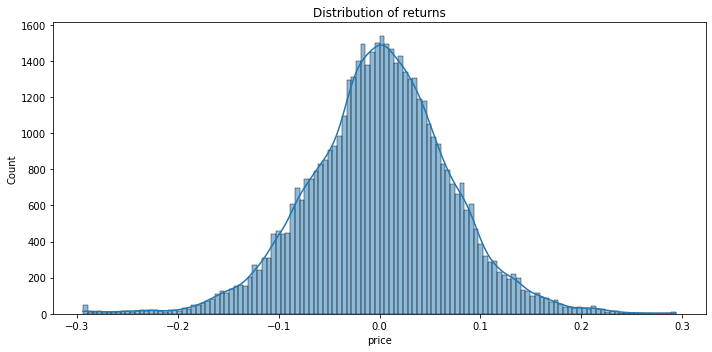

In [52]:
plt.figure(figsize=(10,5))

ax = sns.histplot(data= data.y, x="price", kde=True)
ax.set_title('Distribution of returns')
plt.tight_layout()
plt.show()


Это распределение построил просто ради интереса 

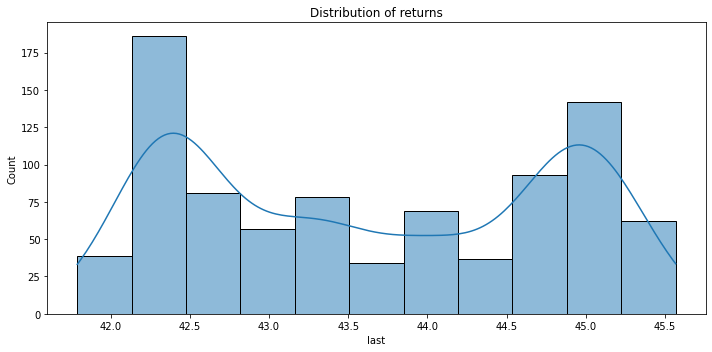

In [55]:
plt.figure(figsize=(10,5))

ax = sns.histplot(data= data['buy_trade_price'], x="last", kde=True)
ax.set_title('Distribution of returns')
plt.tight_layout()
plt.show()

In [57]:
data['buy_trade_price']

,count,nunique,mean,median,std,min,max,first,last
0,1,1,44.213,44.213,NaN,44.213,44.213,44.213,44.213
1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,1,44.226,44.226,NaN,44.226,44.226,44.226,44.226
4,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
49995,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49996,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49997,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49998,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [58]:
data['buy_trade_quantity']

,nunique,sum,mean,median,std,min,max,first,last
0,1,30.5,30.5,30.5,NaN,30.5,30.5,30.5,30.5
1,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,30.9,30.9,30.9,NaN,30.9,30.9,30.9,30.9
4,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
49995,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49996,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49997,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49998,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Как я считаю суммарный объем трейлов buy и sell. Я взял среднюю стоимость трейда(если они были в эту секунду), умножил ее на (среднее кол-во за трейд в эту секунду  * кол-во уникальных трейдов). Таким образом я получил величину (средняя цена * на общий объем), что показывает суммарный объем в эту секунду. 

In [61]:
data['vol_buy'] = np.zeros(data.shape[0])
data['vol_sell'] = np.zeros(data.shape[0])

data['vol_buy'] = data['buy_trade_price']['mean'] * (data['buy_trade_quantity']['mean'] * data['buy_trade_quantity']['nunique'])
data['vol_sell'] = data['sell_trade_price']['mean'] * (data['sell_trade_quantity']['mean'] * data['sell_trade_quantity']['nunique'])





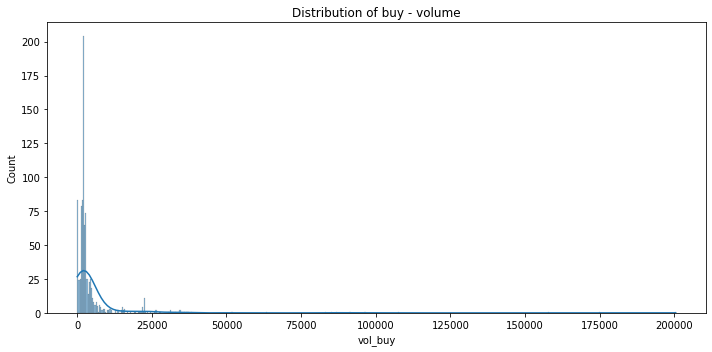

In [62]:
plt.figure(figsize=(10,5))

ax = sns.histplot(data= data, x="vol_buy", kde=True)
ax.set_title('Distribution of buy - volume')
plt.tight_layout()
plt.show()

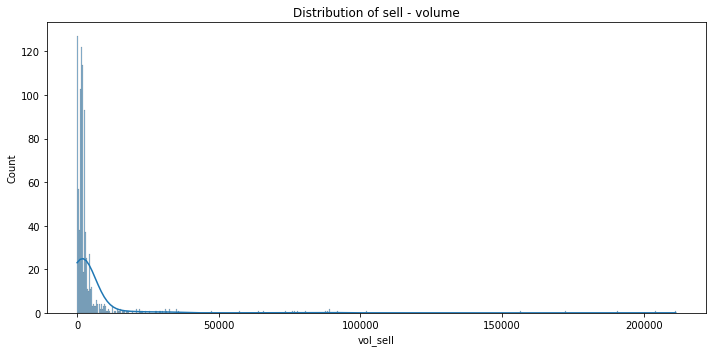

In [63]:
plt.figure(figsize=(10,5))

ax = sns.histplot(data= data, x="vol_sell", kde=True)
ax.set_title('Distribution of sell - volume')
plt.tight_layout()
plt.show()

Видим очень большие хвосты у распределений

In [64]:
data['total_count'] = data['buy_trade_price']['count'] + data['sell_trade_price']['count']

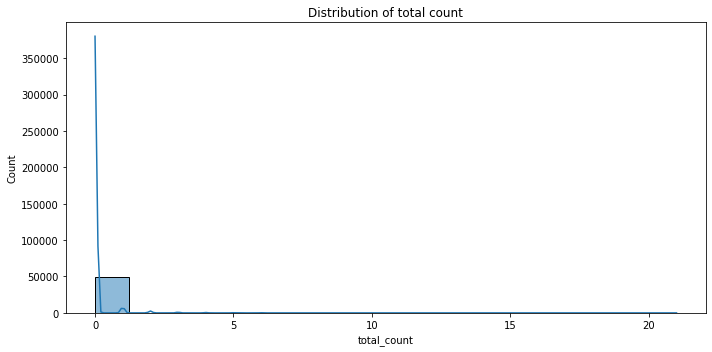

In [65]:
plt.figure(figsize=(10,5))

ax = sns.histplot(data= data, x="total_count", kde=True)
ax.set_title('Distribution of total count')
plt.tight_layout()
plt.show()

Либо я не очень понял, что нужно строить, либо не очень понятно зачем это распределение вообще нужно. 

Создадим новую фичу: $p_{\max} - p_{\min}$

Посчитаем кумулятивные объемы для стакана.  Сначала для бида, потом для аска. 

In [68]:
data['bid_quantity_0']

,nunique,sum,mean,median,std,min,max,first,last
0,5,25880.7,392.131818,43.20,756.794113,5.9,1985.0,1985.0,5.9
1,1,76.7,5.900000,5.90,0.000000,5.9,5.9,5.9,5.9
2,3,597.5,39.833333,60.30,24.228515,5.9,60.3,5.9,60.3
3,2,2062.8,39.669231,30.50,13.888033,30.5,60.3,60.3,30.5
4,2,6350.8,302.419048,366.40,135.157396,30.5,366.4,30.5,366.4
...,...,...,...,...,...,...,...,...,...
49995,4,51132.0,1065.250000,1064.75,1045.700162,30.5,2101.0,30.5,30.5
49996,2,458.1,19.087500,30.50,12.673537,5.6,30.5,30.5,5.6
49997,1,22.4,5.600000,5.60,0.000000,5.6,5.6,5.6,5.6
49998,2,41.7,13.900000,5.60,14.376022,5.6,30.5,5.6,5.6


In [71]:
for i in range(5):
    if i > 0:
        data[f'bid_cum_vol_{i}'] = data[f'bid_cum_vol_{i - 1}'] + data[f'bid_quantity_{i}']['last']
    else:
        data[f'bid_cum_vol_{i}'] = data[f'bid_quantity_{i}']['last']

In [73]:
for i in range(5):
    if i > 0:
        data[f'ask_cum_vol_{i}'] = data[f'ask_cum_vol_{i - 1}'] + data[f'ask_quantity_{i}']['last']
    else:
        data[f'ask_cum_vol_{i}'] = data[f'ask_quantity_{i}']['last']

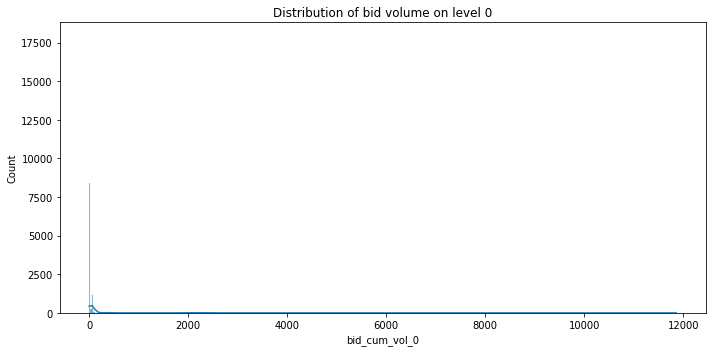

In [74]:
plt.figure(figsize=(10,5))

ax = sns.histplot(data= data, x="bid_cum_vol_0", kde=True)
ax.set_title('Distribution of bid volume on level 0')
plt.tight_layout()
plt.show()

В этот момент меня смутило, что на всех графиках очень большие хвосты. При условии, что этот инструмент видимо не очень ликвидный, по нему иногда проходят какие-то трейды на очень большие суммы, что возможно является аномалией, про которую писали в условии этого задания. 

In [87]:
fig = px.scatter(x= data['bid_cum_vol_1'], y=data.y.price, title=f'График зависимости таргета об объема на первом уровне стакана')
fig.show()

In [78]:
fig = px.scatter(x= data['ask_cum_vol_1'], y=data.y.price, title=f'График зависимости таргета об объема на первом уровне стакана')
fig.show()

In [88]:
fig = px.scatter(x= data['buy_trade_price']['nunique'], y=data.y.price, title=f'График зависимости таргета об nunique трейдов')
fig.show()

In [81]:
fig = px.scatter(x= data['sell_trade_price']['nunique'], y=data.y.price, title=f'График зависимости таргета об nunique трейдов')
fig.show()

Видим, что тенденция снижения амлитуды разброса таргета нуля вокрун таргета сохраняется. Плотность и в целом кол-во точек тоже уменьшается. 

In [82]:
data['diff_unique'] = data['buy_trade_price']['nunique'] - data['sell_trade_price']['nunique']
data['diff_count'] = data['buy_trade_price']['count'] - data['sell_trade_price']['count']

In [89]:
fig = px.scatter(x= data['diff_unique'], y=data.y.price, title=f'График зависимости таргета от разницы unique')
fig.show()

In [90]:
fig = px.scatter(x= data['diff_count'], y=data.y.price, title=f'График зависимости таргета от разницы count')
fig.show()

Опять же при увеличении абсолютного значения разницы амлитуда изменения таргета в обем стороны падает и трейдов становится меньше. 

In [85]:
data.y.describe()

,price
count,50000.000000
mean,0.000457
std,0.070580
min,-0.293779
25%,-0.042033
50%,0.001600
75%,0.044370
max,0.293779


In [86]:
data.y.quantile(0.95)

price    0.1132
Name: 0.95, dtype: float64